<a href="https://colab.research.google.com/github/zohaibsyedk/NFLCrystalBall/blob/main/NFLCrystalBall.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# NFL Game Prediction Model
Using a combination of SVC-rbf, Logistic Regression, SVC-linear, Random Forest Classification, KNeighbors Classification, and Gradient BoostingClassification to predict NFL game outcomes

### Importing Libraries



In [37]:
# import packages and libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression, RidgeClassifier, Perceptron
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report
import time
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

## Step 1: Loading Dataset
This dataset was built from scratch, using metrics from several websites, and stitched together using a python script I wrote.

In [38]:

df = pd.read_csv("/content/finaldata3.csv")
print(df.shape)

df.head()

(435, 25)


,Winner,0O_EPA/play,0O_Success Rate (SR),0O_Dropback EPA,0O_Dropback SR,0O_Rush EPA,0O_Rush SR,0D_EPA/play,0D_Success Rate (SR),0D_Dropback EPA,...,1O_Dropback EPA,1O_Dropback SR,1O_Rush EPA,1O_Rush SR,1D_EPA/play,1D_Success Rate (SR),1D_Dropback EPA,1D_Dropback SR,1D_Rush EPA,1D_Rush SR
0,1,-0.0003,0.392,0.0000,0.425,-0.0010,0.333,-0.0005,0.406,0.0000,...,-0.0003,0.412,-0.0014,0.383,0.0000,0.441,0.0002,0.460,-0.0002,0.415
1,1,0.0000,0.419,-0.0004,0.420,0.0000,0.418,0.0015,0.506,0.0020,...,0.0000,0.461,-0.0018,0.362,0.0008,0.460,0.0018,0.493,-0.0004,0.416
2,1,0.0015,0.496,0.0026,0.536,0.0002,0.448,-0.0004,0.424,-0.0001,...,-0.0007,0.429,-0.0011,0.380,0.0007,0.460,0.0017,0.492,-0.0006,0.418
3,1,0.0004,0.484,0.0008,0.493,-0.0001,0.473,0.0004,0.454,0.0010,...,0.0008,0.485,-0.0024,0.377,-0.0002,0.431,0.0002,0.464,0.0000,0.377
4,0,-0.0003,0.392,0.0000,0.425,-0.0010,0.333,-0.0005,0.406,0.0000,...,0.0005,0.438,-0.0012,0.369,-0.0001,0.447,0.0002,0.470,-0.0008,0.409


### Converting columns to Numeric

In [39]:
cls = ["0O_Success Rate (SR)", "0O_Dropback SR", "0O_Rush SR", "0D_Success Rate (SR)", "0D_Dropback SR", "0D_Rush SR", "1O_Success Rate (SR)", "1O_Dropback SR", "1O_Rush SR", "1D_Success Rate (SR)", "1D_Dropback SR", "1D_Rush SR"]

for col in cls:
  df[col] = pd.to_numeric(df[col], errors='raise')

df.head(30)





,Winner,0O_EPA/play,0O_Success Rate (SR),0O_Dropback EPA,0O_Dropback SR,0O_Rush EPA,0O_Rush SR,0D_EPA/play,0D_Success Rate (SR),0D_Dropback EPA,...,1O_Dropback EPA,1O_Dropback SR,1O_Rush EPA,1O_Rush SR,1D_EPA/play,1D_Success Rate (SR),1D_Dropback EPA,1D_Dropback SR,1D_Rush EPA,1D_Rush SR
0,1,-0.0003,0.392,0.0000,0.425,-0.0010,0.333,-0.0005,0.406,0.0000,...,-0.0003,0.412,-0.0014,0.383,0.0000,0.441,0.0002,0.460,-0.0002,0.415
1,1,0.0000,0.419,-0.0004,0.420,0.0000,0.418,0.0015,0.506,0.0020,...,0.0000,0.461,-0.0018,0.362,0.0008,0.460,0.0018,0.493,-0.0004,0.416
2,1,0.0015,0.496,0.0026,0.536,0.0002,0.448,-0.0004,0.424,-0.0001,...,-0.0007,0.429,-0.0011,0.380,0.0007,0.460,0.0017,0.492,-0.0006,0.418
3,1,0.0004,0.484,0.0008,0.493,-0.0001,0.473,0.0004,0.454,0.0010,...,0.0008,0.485,-0.0024,0.377,-0.0002,0.431,0.0002,0.464,0.0000,0.377
4,0,-0.0003,0.392,0.0000,0.425,-0.0010,0.333,-0.0005,0.406,0.0000,...,0.0005,0.438,-0.0012,0.369,-0.0001,0.447,0.0002,0.470,-0.0008,0.409
5,0,0.0011,0.452,0.0016,0.477,0.0005,0.428,-0.0008,0.399,-0.0002,...,0.0032,0.525,0.0005,0.460,-0.0001,0.405,0.0000,0.447,-0.0017,0.315
6,0,-0.0720,0.402,-0.0360,0.412,-0.1420,0.383,0.0020,0.441,0.0240,...,0.2980,0.500,0.0290,0.448,-0.0040,0.444,0.0940,0.486,-0.1630,0.377
7,1,-0.1310,0.410,-0.0580,0.448,-0.2830,0.331,0.0160,0.434,0.0880,...,0.1350,0.508,-0.1190,0.389,-0.0910,0.413,-0.0350,0.440,-0.2030,0.358
8,0,0.0810,0.448,0.1820,0.475,-0.0300,0.419,-0.0660,0.447,-0.0230,...,-0.1960,0.375,-0.1400,0.361,0.0180,0.414,0.0970,0.442,-0.0910,0.376
9,0,0.1330,0.494,0.2110,0.526,0.0120,0.444,0.0170,0.451,0.0940,...,0.1930,0.529,-0.0810,0.374,0.0540,0.463,0.0870,0.470,0.0000,0.452


## Pair-plots of the data

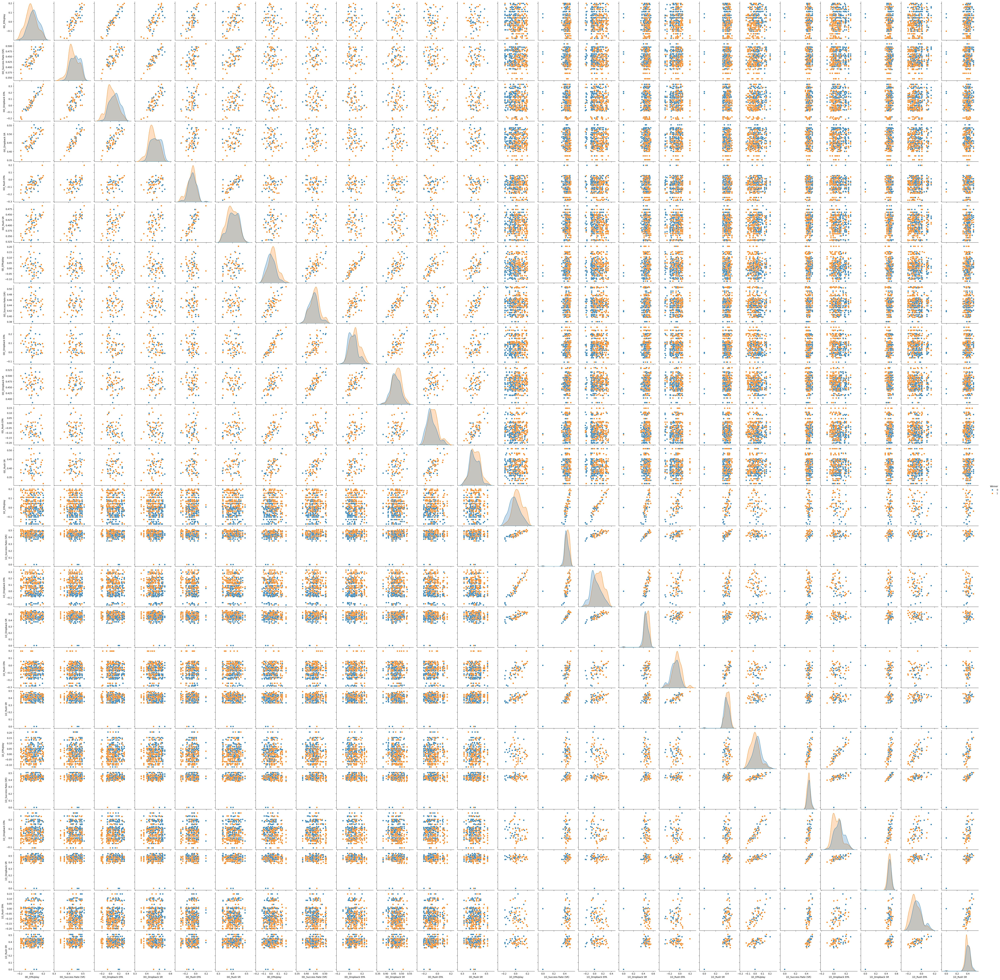

In [40]:
sns.pairplot(df, hue="Winner")
plt.show()

## Step 3: Cleaning the data


In [41]:
# define columns that cannot be zero or NaN
bad_cols = ["Winner", "0O_EPA/play", "0O_Success Rate (SR)", "0O_Dropback EPA",	"0O_Dropback SR", "0O_Rush EPA", "0O_Rush SR", "0D_EPA/play", "0D_Success Rate (SR)", "0D_Dropback EPA","0D_Dropback SR", "0D_Rush EPA", "0D_Rush SR", "1O_EPA/play", "1O_Success Rate (SR)", "1O_Dropback EPA", "1O_Dropback SR",	"1O_Rush EPA", 	"1O_Rush SR", 	"1D_EPA/play", 	"1D_Success Rate (SR)",	"1D_Dropback EPA", 	"1D_Dropback SR", 	"1D_Rush EPA", "1D_Rush SR"]

# create a mask of good rows (none of these columns are 0 or NaN)
good_rows = (~df[bad_cols].isna().any(axis=1))

# filter the DataFrame
df_clean = df[good_rows].copy()

print("Original shape:", df.shape)
print("Cleaned shape:", df_clean.shape)


Original shape: (435, 25)
Cleaned shape: (435, 25)


### Visualizing Clean Data



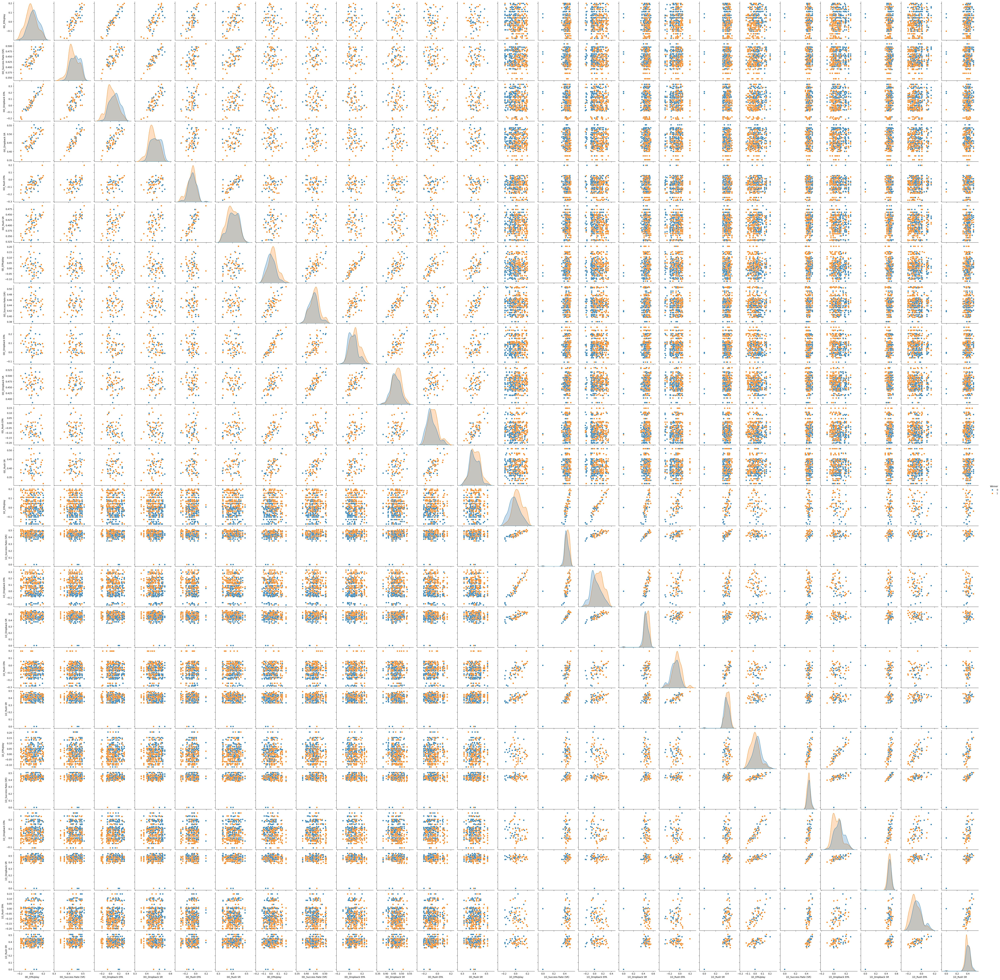

In [42]:
sns.pairplot(df_clean, hue="Winner")
plt.show()

## Preparing Data for Training






In [ ]:
# Separate X to predict y
X, y, = df.drop("Winner", axis=1), df["Winner"]

# Split the data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

X_train.info()

##Scaling the Data



In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Setting up all Machine Learning Models



In [45]:
model1 = SVC(kernel='rbf', probability=True)
model2 = LogisticRegression(max_iter=500)
model3 = SVC(kernel='linear', probability=True)
model4 = RandomForestClassifier(n_estimators=100)
model5 = KNeighborsClassifier(n_neighbors=5)
model6 = GradientBoostingClassifier()


## Training the Models


In [46]:

model1.fit(X_train, y_train)


SVC(probability=True)

In [47]:
model2.fit(X_train, y_train)

LogisticRegression(max_iter=500)

In [48]:
model3.fit(X_train, y_train)

SVC(kernel='linear', probability=True)

In [49]:
model4.fit(X_train, y_train)

RandomForestClassifier()

In [50]:
model5.fit(X_train, y_train)

KNeighborsClassifier()

In [51]:
model6.fit(X_train, y_train)

GradientBoostingClassifier()

## Evaluating the Models on Test Data



In [52]:
y1_pred = model1.predict(X_test)
y2_pred = model2.predict(X_test)
y3_pred = model3.predict(X_test)
y4_pred = model4.predict(X_test)
y5_pred = model5.predict(X_test)
y6_pred = model6.predict(X_test)
acc1 = accuracy_score(y_test, y1_pred)
acc2 = accuracy_score(y_test, y2_pred)
acc3 = accuracy_score(y_test, y3_pred)
acc4 = accuracy_score(y_test, y4_pred)
acc5 = accuracy_score(y_test, y5_pred)
acc6 = accuracy_score(y_test, y6_pred)
print(f"SVC rbf Model Accuracy: {acc1:.3f}")
print(classification_report(y_test, y1_pred))
print(f"Logistic Regression: {acc2:.3f}")
print(classification_report(y_test, y2_pred))
print(f"SVC linear Model Accuracy: {acc3:.3f}")
print(classification_report(y_test, y3_pred))
print(f"Random Forest Classification Model Accuracy: {acc4:.3f}")
print(classification_report(y_test, y4_pred))
print(f"KNeighbors Classification Model Accuracy: {acc5:.3f}")
print(classification_report(y_test, y5_pred))
print(f"Gradient Boosting Classifier Model Classification: {acc6:.3f}")
print(classification_report(y_test, y6_pred))


SVC rbf Model Accuracy: 0.649
              precision    recall  f1-score   support

           0       0.62      0.58      0.60        60
           1       0.67      0.70      0.68        71

    accuracy                           0.65       131
   macro avg       0.65      0.64      0.64       131
weighted avg       0.65      0.65      0.65       131

Logistic Regression: 0.656
              precision    recall  f1-score   support

           0       0.64      0.58      0.61        60
           1       0.67      0.72      0.69        71

    accuracy                           0.66       131
   macro avg       0.65      0.65      0.65       131
weighted avg       0.66      0.66      0.65       131

SVC linear Model Accuracy: 0.679
              precision    recall  f1-score   support

           0       0.67      0.58      0.62        60
           1       0.68      0.76      0.72        71

    accuracy                           0.68       131
   macro avg       0.68      0.67     

## Step 9: Making Predictions on new data (currently week 14 of the 2025-26 NFL season)

In [53]:
# Reading in data for current week games
predis = pd.read_csv("/content/week14picks.csv")

# Scaling the data
predis_scaled = scaler.transform(predis)

# Makeing 2 matricies of outcomes and probabilities for all models.
predicts = [model1, model2, model3, model4,model5, model6]
outcomes = []
probs = []
for item in predicts:
  probabilities = item.predict_proba(predis_scaled)
  predictions = item.predict(predis_scaled)
  outcomes.append(predictions)
  probs.append(probabilities)

# Weighting each predictions probability for final outcomes and probabilities
finprobs = []
for i in range(0,14):
  att0 = 0
  att1 = 0
  for j in range(0, len(probs)):
    prb0 = probs[j][i][0]
    prb1 = probs[j][i][1]
    if (j == 0) or (j == 2):
      att0 = att0 +  (prb0*(0.2))
      att1 = att1 +  (prb1*(0.2))
    elif (j == 1):
      att0 = att0 +  (prb0*(0.15))
      att1 = att1 +  (prb1*(0.15))
    elif (j == 3):
      att0 = att0 +  (prb0*(0.25))
      att1 = att1 +  (prb1*(0.25))
    else:
      att0 = att0 +  (prb0*(0.1))
      att1 = att1 +  (prb1*(0.1))
  finpr = [float(att0), float(att1)]
  finprobs.append(finpr)
finouts = []
for k in range(0,len(finprobs)):
  if finprobs[k][0] > finprobs[k][1]:
    finouts.append(0)
  else:
    finouts.append(1)

for l in range(0,len(finouts)):
  print(f"Game {l+1}: Team {finouts[l]}, Probabilities: {finprobs[l]}")

Game 1: Team 0, Probabilities: [0.5846459263752346, 0.4153540736247654]
Game 2: Team 1, Probabilities: [0.18047162675474035, 0.8195283732452597]
Game 3: Team 0, Probabilities: [0.7125773433993375, 0.28742265660066263]
Game 4: Team 0, Probabilities: [0.7563404767947683, 0.24365952320523182]
Game 5: Team 1, Probabilities: [0.48395328548104244, 0.5160467145189577]
Game 6: Team 1, Probabilities: [0.30931316451055885, 0.6906868354894412]
Game 7: Team 0, Probabilities: [0.6746979910001152, 0.3253020089998848]
Game 8: Team 1, Probabilities: [0.25653651785853626, 0.7434634821414637]
Game 9: Team 0, Probabilities: [0.5202558694812012, 0.47974413051879883]
Game 10: Team 1, Probabilities: [0.20022946527836416, 0.799770534721636]
Game 11: Team 0, Probabilities: [0.6272207184248472, 0.37277928157515294]
Game 12: Team 1, Probabilities: [0.14031732785905704, 0.8596826721409428]
Game 13: Team 1, Probabilities: [0.33439666301970716, 0.6656033369802928]
Game 14: Team 0, Probabilities: [0.532578829988420

# Week 14 Predictions
#### Game 1 Dallas @ Detroit: **Detroit Wins (59.45%) -170**

#### Game 2 Seattle @ Atlanta: **Seattle Wins (83.54%) -450**

#### Game 3 Cincinnati @ Buffalo: **Buffalo Win (72.70%) -280**

#### Game 4 Tennessee @ Cleveland: **Cleveland Win (79.42%) -220**

#### Game 5 Washington @ Minnesota: **Washington Win (53.53%) -120**

#### Game 6 Miami @ New York Jets: **Miami Wins (69.83%) -160**

#### Game 7 New Orleans @ Tampa Bay: **Tampa Bay Win (68.86%) -540**

#### Game 8 Indianapolis @ Jacksonville: **Indianapolis Win (76.98%) -135**

#### Game 9 Pittsburh @ Baltimore: **Baltimore Win (52.55%) -320**

#### Game 10 Denver @ Las Vegas: **Denver Win (79.93%) -505**

#### Game 11 Chicago @ Green Bay: **Green Bay Win (61.79%) -300**

#### Game 12 LA Rams @ Arizona: **LA Rams Win (87.17%) -475**

#### Game 13 Houston @ Kansas City: **Houston Wins (67.14%) +160**

#### Game 14 Philadelphia @ LA Chargers: **LA Chargers Win (51.52%) +130**

# Upsets Predicted:
#### Houston Win over Kansas City +160 (67.14%)
#### LA Chargers Win over Philadelphia +130 (51.25%)